In [1]:
import os; os.chdir('/net/beegfs/users/P101440/DCE_NIK')
import warnings; warnings.filterwarnings('ignore')
import json, numpy as np, pandas as pd
from IPython.display import Image, display
pd.set_option('display.max_columns', None); pd.set_option('display.width', 220)
def low(df):
    df = df.copy(); df.columns = [str(c).lower() for c in df.columns]
    df[df.columns[0]] = df[df.columns[0]].astype(str).str.lower(); return df

# nik vs cs / grasp-pro, dce-mri recon

| dataset | reference | measure |
|---|---|---|
| phantom, xcat no-motion | ground truth | accuracy |
| real in-vivo | cs / model-free recon, no gt | consistency |

# 1. phantom, xcat no-motion, vs ground truth
methods: cs-file, grasp-pro (k12, cv), nik f0/sub5/sub16/free. truth-scaled, median rois.
spokes: nik + grasp-pro 5/frame (matched). cs-file 7/frame (sim ref, +40%, unmatched).

### roi placement, truth. aorta red, cortex green, medulla orange

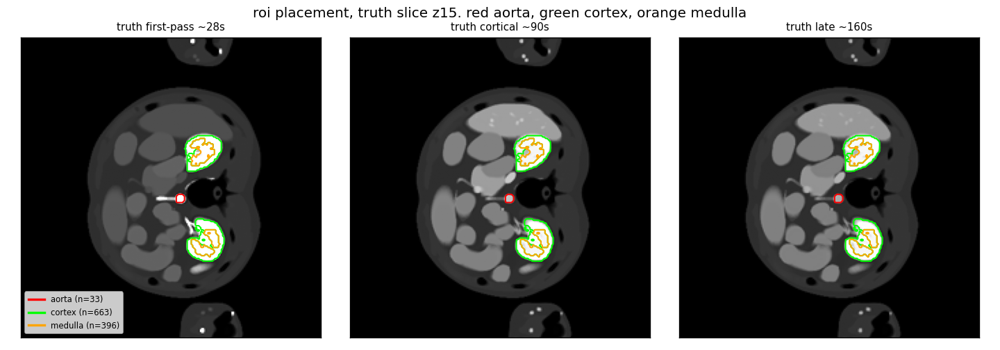

In [2]:
display(Image('/net/beegfs/users/P101440/DCE_NIK/results/xcat_physical_nomotion_nik_vs_grasp/figures/fig0_roi_check.png'))

### image metrics, body-masked, vs truth (2x oversample render)
best nik haarpsi 0.90 > grasp 0.87 (first metric nik wins). psnr gap 4.3 -> 1.2 db. ssim 0.93 vs 0.95.

In [3]:
reb = pd.read_csv('/net/beegfs/users/P101440/DCE_NIK/results/xcat_physical_nomotion_nik_vs_grasp/l3_rebaseline.csv').round(4)
display(low(reb))

,name,psnr,ssim,haarpsi,nrmse,c_aorta,c_cortex,c_medulla,aorta_ttp,aorta_pk
0,grasp-k12 (ref),38.5314,0.9515,0.8707,0.0103,0.1606,0.0546,0.0537,30.0104,0.7928
1,sub16 mean,36.4199,0.9205,0.8871,0.0148,0.1561,0.0500,0.0475,28.7056,0.8382
2,sub16 cplx-seedavg,36.7530,0.9247,0.8965,0.0143,0.1431,0.0484,0.0452,28.4446,0.8370
3,sub5 mean,33.2258,0.9043,0.8404,0.0196,0.2809,0.1149,0.1307,30.0104,0.7815
4,sub5 cplx-seedavg,34.3158,0.9124,0.8516,0.0176,0.2727,0.0920,0.1025,30.0104,0.7891
5,sub12 mean,33.0927,0.9043,0.8561,0.0205,0.2260,0.1290,0.1214,28.7926,0.9866
6,sub12 cplx-seedavg,36.1619,0.9256,0.9024,0.0148,0.1972,0.0707,0.0632,28.4446,0.9808
7,free mean,36.1800,0.9006,0.8465,0.0153,0.0885,0.0123,0.0139,27.9227,0.8618
8,free cplx-seedavg,37.3494,0.9180,0.8843,0.0132,0.0805,0.0111,0.0145,27.9227,0.8641
9,f0 mean,32.2059,0.8824,0.8100,0.0220,0.0616,0.1082,0.1308,27.4008,0.8718


### spatial: 1px render bug fixed, residual = low-|k| bias
1px shift (rot180, even grid), nik only. invisible to spectra/nmse/corr, hits ssim. fixed: ssim 0.76 -> 0.91.
residual gap: smooth low-|k| bias (91% low-|k|, +4.2 db post-hoc), from envelope norm (not coil/sense). env 0.75 optimal, dead-end knob.

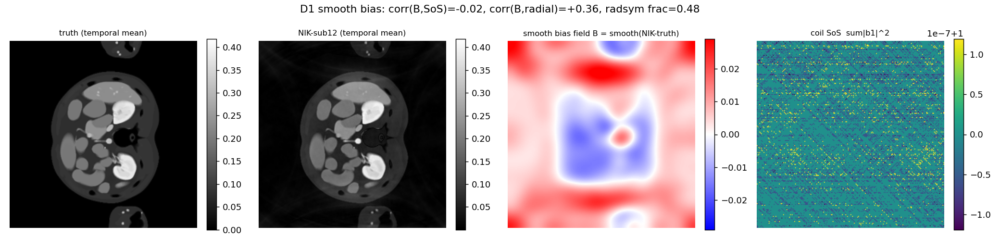

In [4]:
display(Image('/net/beegfs/users/P101440/DCE_NIK/results/xcat_physical_nomotion_nik_vs_grasp/figures/fig_bias_locate.png'))

### render fix 2: single-fov ifft aliasing
single-fov k-grid aliases broadband. 2x oversample: +1.7 to +5.3 db psnr, seed spread collapsed. third render bug (support radius, 1px rot180, aliasing).
caveat: haarpsi one metric. psnr/ssim still grasp. correctness fix, not modelling gain.

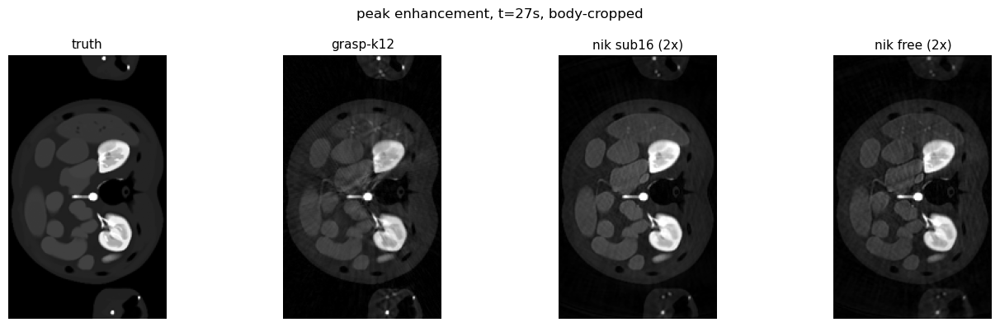

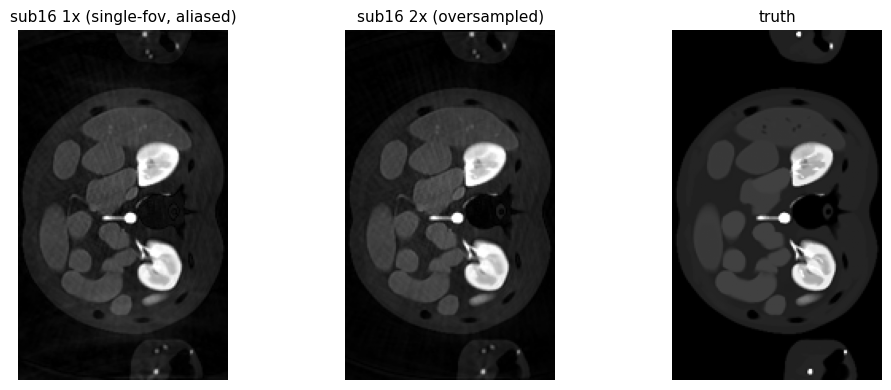

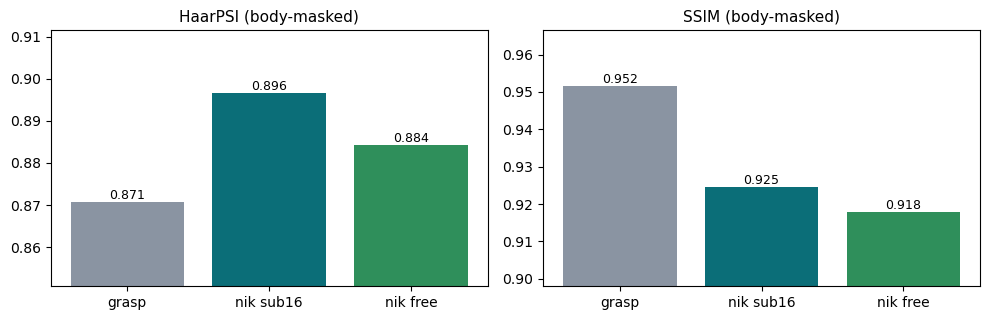

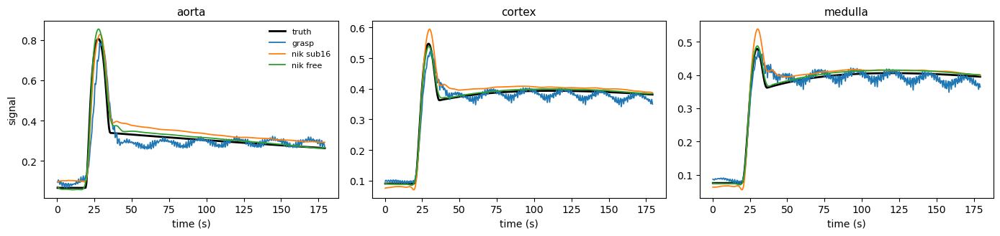

In [5]:
z = np.load('{}/arrays/compare_recons.npz'.format('/net/beegfs/users/P101440/DCE_NIK/results/xcat_physical_nomotion_nik_vs_grasp'))
import matplotlib.pyplot as plt
pk = 1  # frames = [early, peak, late]
body = z['body']; ys, xs = np.where(body); y0, y1, x0, x1 = ys.min(), ys.max()+1, xs.min(), xs.max()+1
crop = lambda im: im[y0:y1, x0:x1]
vmax = float(np.percentile(z['truth'][:, :, pk][body], 99.5))
# best models at peak enhancement
labs = ['truth', 'grasp-k12', 'nik sub16 (2x)', 'nik free (2x)']; ims = [z['truth'], z['grasp'], z['sub16_2x'], z['free_2x']]
fig, ax = plt.subplots(1, 4, figsize=(14, 4.0))
for a, l, im in zip(ax, labs, ims): a.imshow(crop(im[:, :, pk]), cmap='gray', vmin=0, vmax=vmax); a.set_title(l, fontsize=11); a.axis('off')
fig.suptitle('peak enhancement, t={:.0f}s, body-cropped'.format(z['ftimes'][pk]), fontsize=12); plt.tight_layout(); plt.show()
# before / after the oversampling fix (sub16)
fig, ax = plt.subplots(1, 3, figsize=(10.5, 4.0))
for a, l, im in zip(ax, ['sub16 1x (single-fov, aliased)', 'sub16 2x (oversampled)', 'truth'], [z['sub16_1x'][:, :, pk], z['sub16_2x'][:, :, pk], z['truth'][:, :, pk]]):
    a.imshow(crop(im), cmap='gray', vmin=0, vmax=vmax); a.set_title(l, fontsize=11); a.axis('off')
plt.tight_layout(); plt.show()
# metrics, body-masked ruler, best nik (complex seed-avg) vs grasp
reb = pd.read_csv('{}/l3_rebaseline.csv'.format('/net/beegfs/users/P101440/DCE_NIK/results/xcat_physical_nomotion_nik_vs_grasp'))
nm = reb['name'].astype(str).str.strip(); gv = lambda name, col: float(reb[nm == name][col].iloc[0])
fig, ax = plt.subplots(1, 2, figsize=(10, 3.3))
for a, mt, col in zip(ax, ['HaarPSI (body-masked)', 'SSIM (body-masked)'], ['haarpsi', 'ssim']):
    vals = [gv('GRASP-K12 (ref)', col), gv('sub16 cplx-seedavg', col), gv('free cplx-seedavg', col)]
    bars = a.bar(['grasp', 'nik sub16', 'nik free'], vals, color=['#8a94a2', '#0b6e78', '#2f8f5b'])
    a.set_title(mt, fontsize=11); a.set_ylim(min(vals)-0.02, max(vals)+0.015)
    for b, v in zip(bars, vals): a.text(b.get_x()+b.get_width()/2, v, '%.3f' % v, ha='center', va='bottom', fontsize=9)
plt.tight_layout(); plt.show()
# contrast curves, aorta / cortex / medulla, best models vs truth
t = z['times']; fig, ax = plt.subplots(1, 3, figsize=(14, 3.4))
for a, roi in zip(ax, ['aorta', 'cortex', 'medulla']):
    a.plot(t, z['cur_truth_'+roi], 'k-', lw=2, label='truth'); a.plot(t, z['cur_grasp_'+roi], lw=1.3, label='grasp')
    a.plot(t, z['cur_sub16_'+roi], lw=1.3, label='nik sub16'); a.plot(t, z['cur_free_'+roi], lw=1.3, label='nik free')
    a.set_title(roi, fontsize=11); a.set_xlabel('time (s)')
ax[0].set_ylabel('signal'); ax[0].legend(fontsize=8, frameon=False); plt.tight_layout(); plt.show()

### seed reproducibility, spread ~ grasp gap
3 seeds: ssim spread 0.023-0.034, psnr 3.4 db, aorta peak 0.24. spread ~ gap to grasp (0.05 ssim). nik = seed distribution, grasp = point.

### recons. truth top, methods below, dce phases

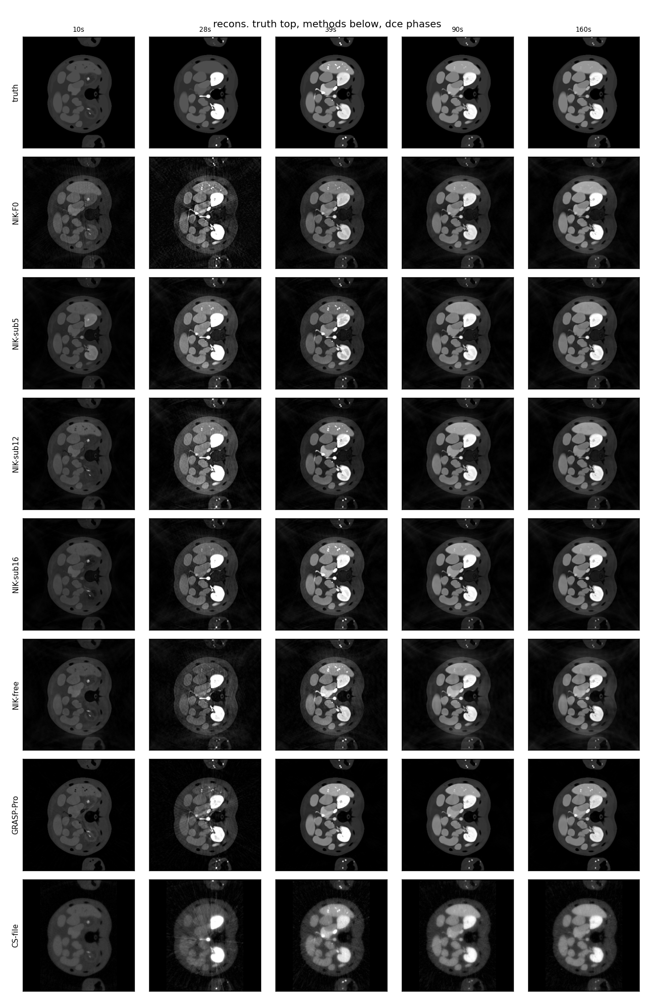

In [6]:
display(Image('/net/beegfs/users/P101440/DCE_NIK/results/xcat_physical_nomotion_nik_vs_grasp/figures/fig1_montage.png'))

### contrast curves, two failure modes
nik: whole curve + timing (aorta 0.08 vs grasp 0.16), aorta peak +10% overshoot (seed-variable). grasp: peak-exact, ~2.6s late. curves in render-fix-2 panel.

### error maps, recon vs truth

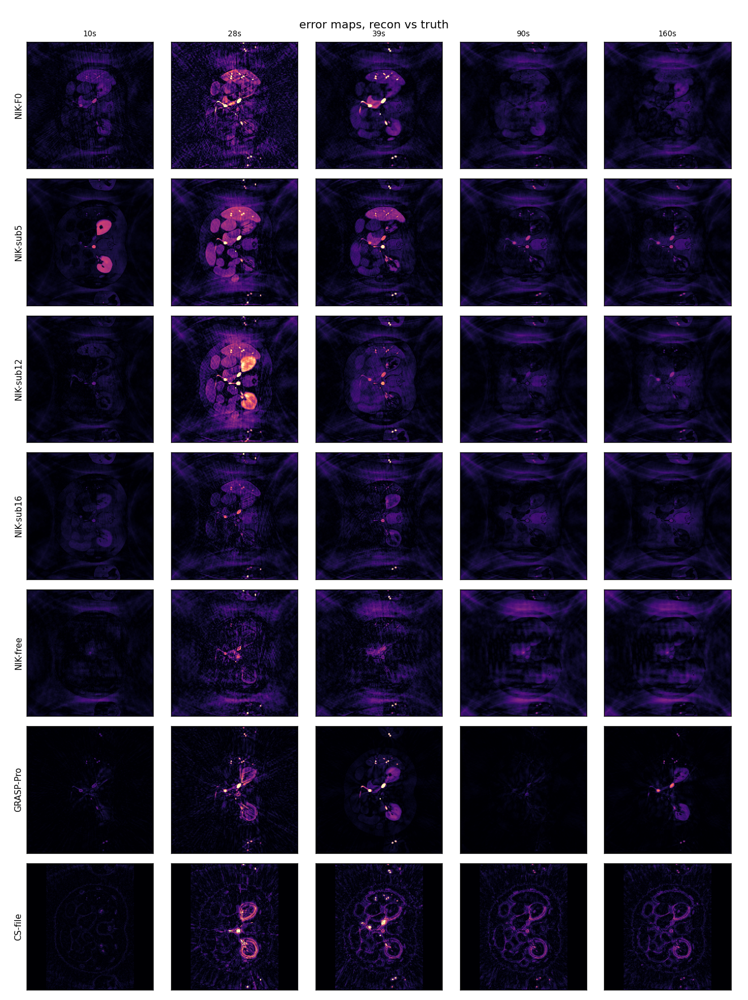

In [7]:
display(Image('/net/beegfs/users/P101440/DCE_NIK/results/xcat_physical_nomotion_nik_vs_grasp/figures/fig2_errormaps.png'))

### pk maps, signal-domain patlak, relative. nik-sub16 best (ktrans near truth); sub12 unreliable (seed); grasp under-reads aorta vp

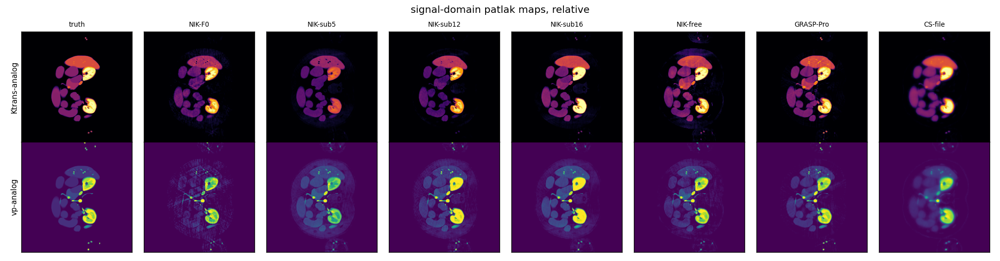

,param/roi (signal-patlak),truth,nik-f0,nik-sub5,nik-sub12,nik-sub16,nik-free,grasp-pro,cs-file
0,ktrans_aorta,0.0000,-0.0177,0.0083,-0.1292,0.0064,0.0110,0.0314,0.0117
1,ktrans_cortex,0.2338,0.2004,0.1418,0.1888,0.2528,0.2158,0.2196,0.2112
2,ktrans_medulla,0.2796,0.2393,0.1575,0.2282,0.2906,0.2582,0.2533,0.2657
3,vp_aorta,0.7723,0.8867,0.6774,1.0053,0.7825,0.8625,0.6393,0.4670
4,vp_cortex,0.5118,0.4517,0.3990,0.6345,0.5893,0.4824,0.4779,0.4133
5,vp_medulla,0.4317,0.3698,0.3253,0.5216,0.5268,0.4258,0.4316,0.4364


In [8]:
display(Image('/net/beegfs/users/P101440/DCE_NIK/results/xcat_physical_nomotion_nik_vs_grasp/figures/fig6_pk_maps.png'))
display(low(pd.read_csv('/net/beegfs/users/P101440/DCE_NIK/results/xcat_physical_nomotion_nik_vs_grasp/pk_metrics.csv')))

### choosing k, held-out cv not oracle
variance k=5 misses bolus (pc 10, 0.004% var). held-out cv (truth-blind, nik-style) k*=12, bolus peak 0.77. fair grasp = k12.

,k,val_heldout_nmse,test_heldout_nmse,aorta_peak_truth
0,3,0.00361,0.00357,0.1275
1,5,0.00339,0.00358,0.2334
2,8,0.00200,0.00194,0.4774
3,12,0.00105,0.00115,0.7602
4,16,0.00453,0.00471,0.7520
5,24,0.01517,0.01606,0.5199
6,32,0.02183,0.02122,0.4732


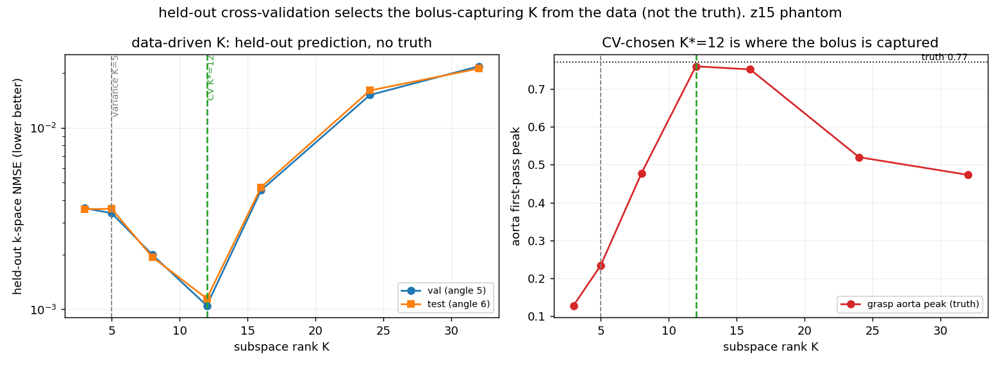

In [9]:
kcv = pd.read_csv('/net/beegfs/users/P101440/DCE_NIK/results/xcat_physical_nomotion_nik_vs_grasp/grasp_kcv.csv')[['K','val_heldout_NMSE','test_heldout_NMSE','aorta_peak_truth']].round(5)
display(low(kcv))
display(Image('/net/beegfs/users/P101440/DCE_NIK/results/xcat_physical_nomotion_nik_vs_grasp/figures/fig_kcv.png'))

### navigator eigenspectrum. bolus = low-variance pc, variance selection misses it

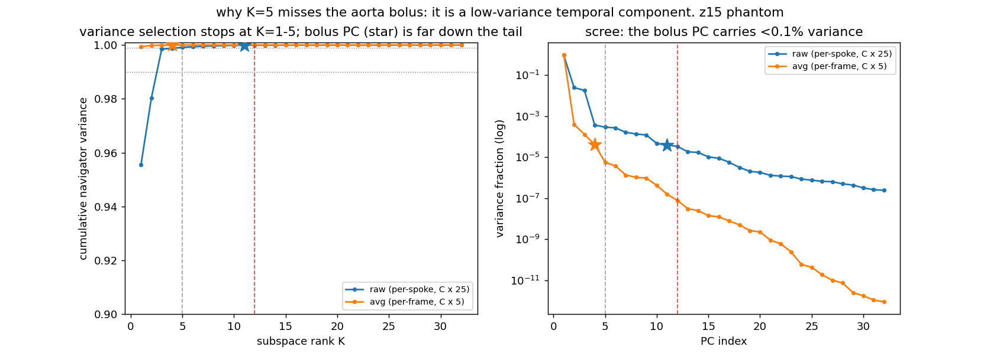

In [10]:
display(Image('/net/beegfs/users/P101440/DCE_NIK/results/xcat_physical_nomotion_nik_vs_grasp/figures/fig_nav_spectrum.png'))

### k-sweep frontier, per-spoke navigator. minimum near k=8-12, collapse past k=12

,k,ssim,haarpsi,curve_aorta,aorta_peak,aorta_fwhm
0,3.0,0.965,0.885,0.677,0.128,56.367
1,5.0,0.963,0.869,0.594,0.233,56.889
2,8.0,0.979,0.899,0.376,0.477,57.411
3,12.0,0.980,0.888,0.222,0.767,10.438
4,16.0,0.925,0.652,0.278,0.752,10.438
5,24.0,0.829,0.467,0.391,0.520,15.658
6,32.0,0.761,0.396,0.438,0.438,56.889


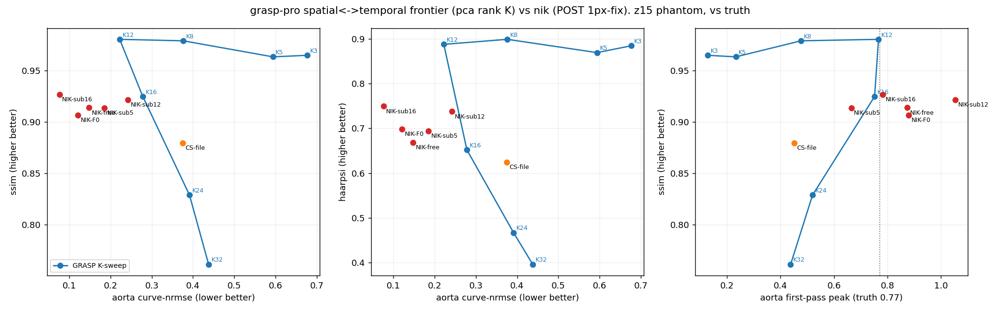

In [11]:
ks = pd.read_csv('/net/beegfs/users/P101440/DCE_NIK/results/xcat_physical_nomotion_nik_vs_grasp/grasp_ksweep_pareto.csv')
ks = ks[ks['family']=='GRASP'][['K','SSIM','HaarPSI','curve_aorta','aorta_peak','aorta_fwhm']].round(3)
display(low(ks))
display(Image('/net/beegfs/users/P101440/DCE_NIK/results/xcat_physical_nomotion_nik_vs_grasp/figures/fig_ksweep_pareto.png'))

### note: old k x spokes/frame figure stale
pre render-fix, unmasked ruler (grasp ~0.91) != body-masked table (grasp 0.87). current = render-fix-2 panel. grasp k-sweep still valid for k*=12.

# 2. real in-vivo, vs cs reference, no ground truth
consistency, not accuracy. ref: cs / model-free. cs-likeness, inter-slice, temporal.

### recons, slice 21. model-free ref, nik, cs

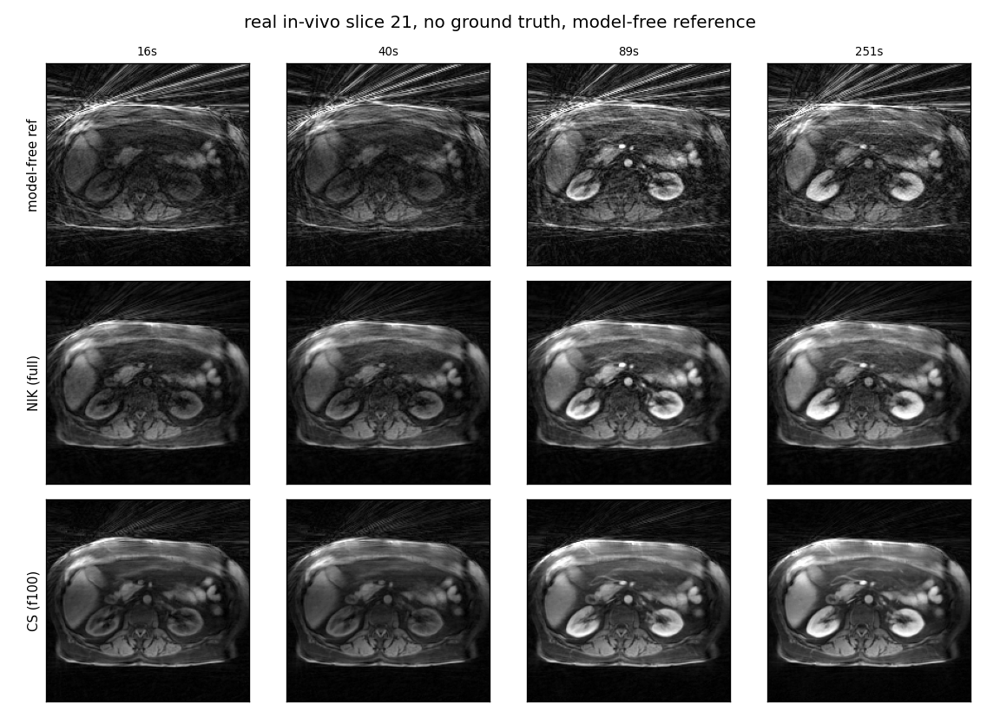

In [12]:
display(Image('/net/beegfs/users/P101440/DCE_NIK/results/realdata_nik_vs_cs_figures/figures/fig4_realdata_montage.png'))

### aorta curve, median, aif-gated roi. roi check below

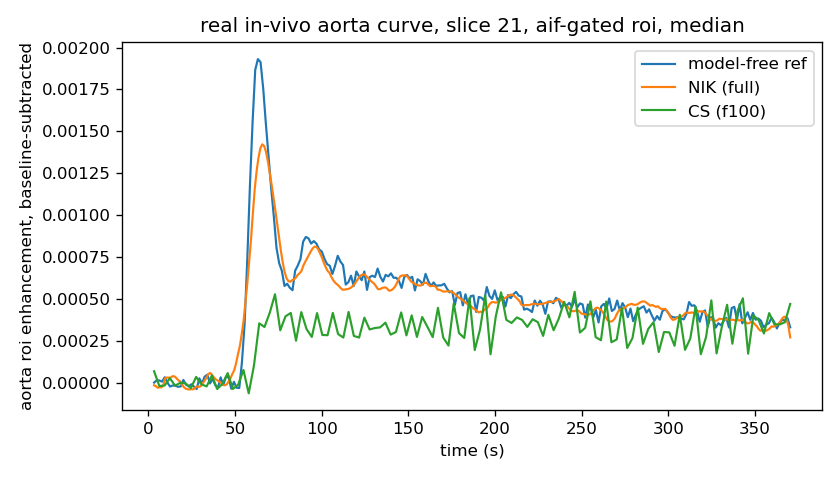

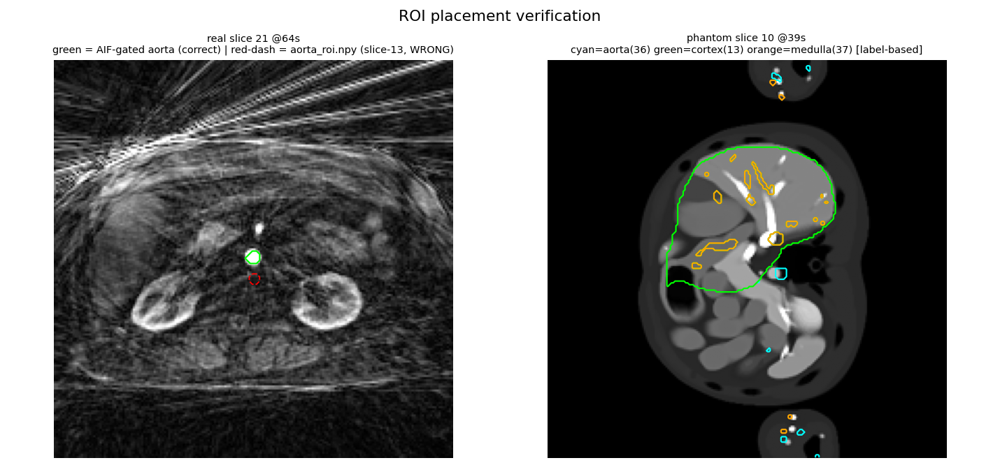

In [13]:
display(Image('/net/beegfs/users/P101440/DCE_NIK/results/realdata_nik_vs_cs_figures/figures/fig5_realdata_aorta_curve.png'))
display(Image('/net/beegfs/users/P101440/DCE_NIK/results/realdata_nik_vs_cs_figures/figures/fig6_roi_verification.png'))

### kidney curves, cortex, medulla, slice 21. model-free ref, nik, cs

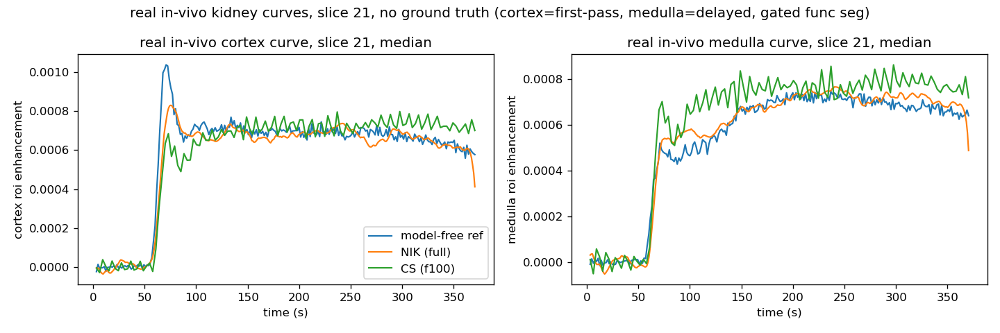

In [14]:
display(Image('/net/beegfs/users/P101440/DCE_NIK/results/realdata_nik_vs_cs_figures/figures/fig7_realdata_kidney_curves.png'))

### motion + rois, real cs axial slice 21, over time. fixed contours, anatomy drift

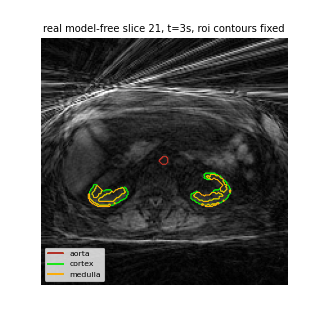

In [15]:
display(Image('/net/beegfs/users/P101440/DCE_NIK/results/realdata_nik_vs_cs_figures/figures/fig8_realdata_motion_rois.gif'))

### temporal denoising, nik advantage, real
cs osc: broadband noise, no respiratory peak. nik smooth. osc = wobble, respfrac = respiratory power.

In [16]:
tS = json.load(open('task_S.json')); sl=[s for s in tS if s in ('18','19','21')]
meth=['ref','CS_f100','CS_f25','NIK_full']
def avg(m,roi,q):
    v=[tS[s][m][roi][q] for s in sl if m in tS[s] and roi in tS[s][m]]
    return np.nanmean(v) if v else np.nan
rows=[[roi,lab]+[round(avg(m,roi,q),4) for m in meth] for roi in ['cortex','medulla','aorta'] for q,lab in [('osc','oscillation'),('respfrac','resp-band frac')]]
display(low(pd.DataFrame(rows, columns=['roi','metric']+meth)))

,roi,metric,ref,cs_f100,cs_f25,nik_full
0,cortex,oscillation,0.0118,0.0133,0.0472,0.0002
1,cortex,resp-band frac,0.7500,0.2499,0.0000,0.0055
2,medulla,oscillation,0.0130,0.0200,0.0441,0.0002
3,medulla,resp-band frac,0.7066,0.2366,0.0000,0.0055
4,aorta,oscillation,0.0129,0.0244,0.0584,0.0004
5,aorta,resp-band frac,0.6170,0.1290,0.0000,0.0022


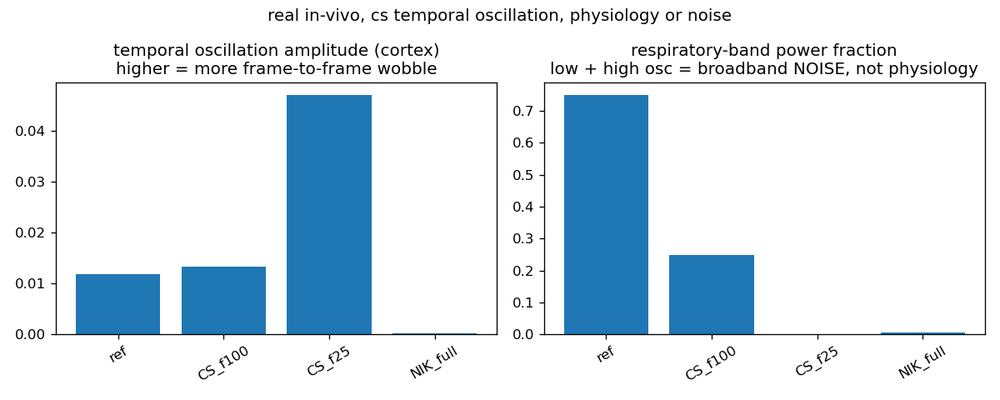

In [17]:
display(Image('/net/beegfs/users/P101440/DCE_NIK/results/realdata_nik_vs_cs_figures/figures/fig3_denoising.png'))

### pk inter-slice consistency. quantification support. nik cov comparable or better vs cs-fit. cov %, lower better

In [18]:
t2=json.load(open('task2.json'))['consistency']; meth=['NIK_F0','NIK_F2','CS_fit']
rows=[[par,roi]+[round(t2[f'{par}_{roi}'].get(m,np.nan),2) for m in meth] for par in ['ktrans','vp'] for roi in ['aorta','cortex','medulla','liver'] if f'{par}_{roi}' in t2]
display(low(pd.DataFrame(rows, columns=['param','roi']+meth)))

,param,roi,nik_f0,nik_f2,cs_fit
0,ktrans,aorta,13.22,14.50,20.77
1,ktrans,cortex,9.02,8.19,9.33
2,ktrans,medulla,2.51,2.15,3.94
3,ktrans,liver,9.29,6.42,9.43
4,vp,aorta,5.38,4.94,4.13
5,vp,cortex,1.94,3.87,3.02
6,vp,medulla,3.97,5.74,3.50
7,vp,liver,3.02,0.57,13.76


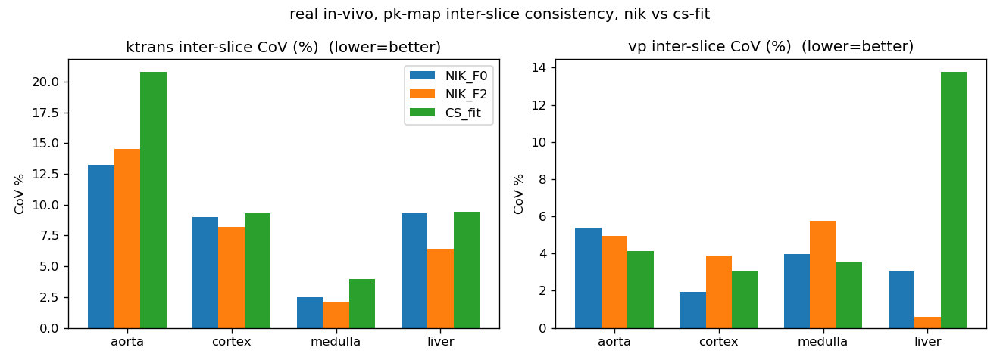

In [19]:
display(Image('/net/beegfs/users/P101440/DCE_NIK/results/realdata_nik_vs_cs_figures/figures/fig2_pk_cov.png'))

### spoke-fraction frontier, fair temporal basis

cs pca basis now from the retained spokes only. previously from all 14 spokes/frame while the data term used m, which leaked held-out spokes into the cs recon and lifted it at every reduced fraction. nik trains on the reduced spokes only, so the old comparison was asymmetric.

fair result: nik and cs level across fractions, nik ahead at 50%. cs drops 0.15-0.18 haarpsi once the basis is honest. ruler is cs-likeness not accuracy, so this reads conservative for nik.

In [20]:
hs=json.load(open('haarpsi_spoke.json')); pct=sorted({r['pct'] for r in hs.values()}, reverse=True)
def g(p,mth): return next((r['mean'] for r in hs.values() if r['pct']==p and r['meth']==mth), np.nan)
display(pd.DataFrame([[p,round(g(p,'NIK'),3),round(g(p,'CS'),3)] for p in pct], columns=['spoke %','nik (vs cs-f100)','cs (self)']))

,spoke %,nik (vs cs-f100),cs (self)
0,100,0.709,1.000
1,71,0.709,0.764
2,50,0.697,0.678
3,36,0.619,0.643
4,29,0.631,0.637


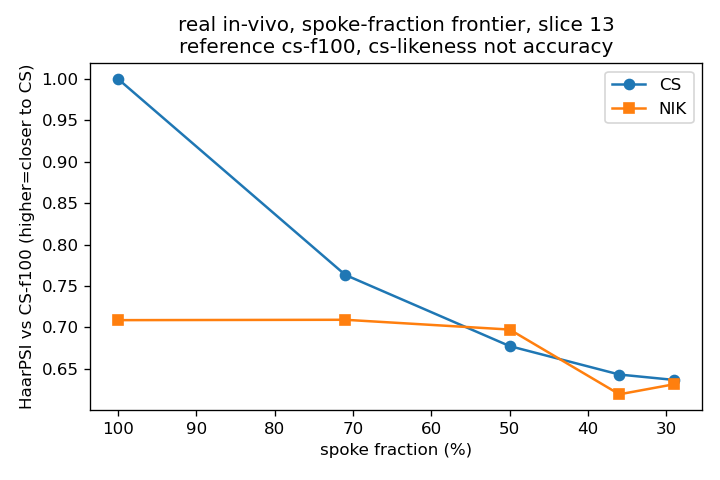

In [21]:
display(Image('/net/beegfs/users/P101440/DCE_NIK/results/realdata_nik_vs_cs_figures/figures/fig1_spoke_frontier.png'))

# 3. coil placement: input embedding vs output heads
coil from input (embedding, f(k,t,coil)->1) to output heads (g(k,t)->c). same ff/gabor/basis/norm/render/scoring. subspace, f0, f2. output ~8x cheaper.

### phantom, vs truth. output-coil beats input-coil (sub16) on every metric, val-selected

| metric | input-coil (sub16) | output-coil | grasp |
|---|---|---|---|
| psnr | 36.12 | **37.21** | 38.53 |
| ssim | 0.922 | **0.928** | 0.952 |
| haarpsi | 0.886 | **0.901** | 0.871 |
| cortex curve nrmse | 0.055 | **0.020** | - |

output-coil wins all, strongest tissue curves (~2.5x lower cortex). haarpsi clears grasp. images: output cleaner, diff dimmer at kidneys.

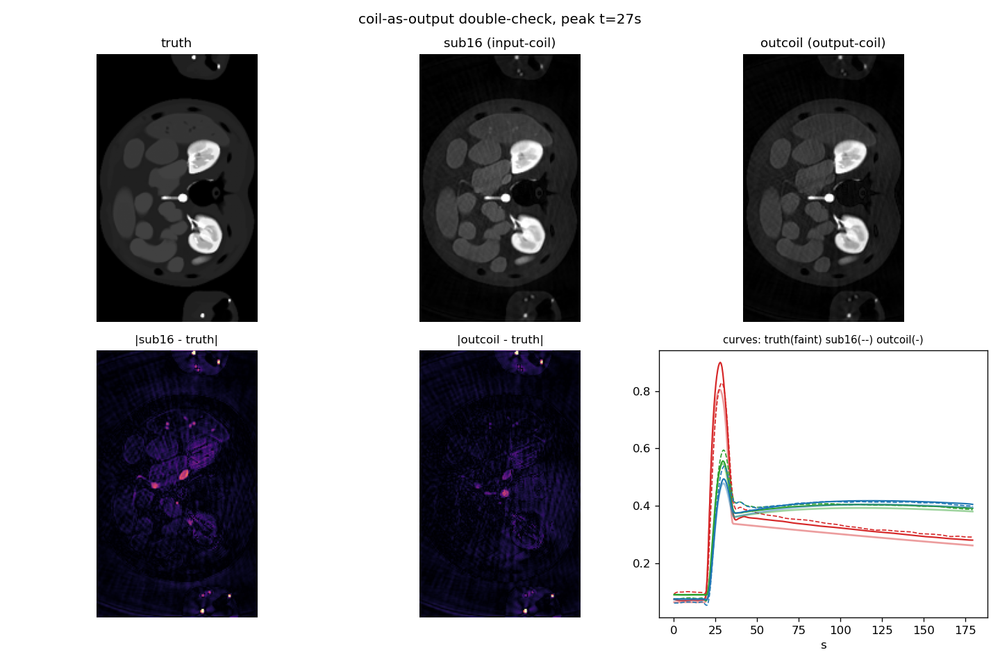

In [22]:
display(Image('/net/beegfs/users/P101440/DCE_NIK/results/xcat_physical_nomotion_nik_vs_grasp/figures/outcoil_compare.png'))

### real slice 21, no ground truth. held-out spoke nmse (matched setup, val spokes)

| held-out nmse | input-coil | output-coil |
|---|---|---|
| subspace | **0.294** | 0.352 |
| f2 | **0.508** | 0.536 |
| f0 | 0.707 | **0.684** |

parity, no winner. vs model-free nufft ref: input tracks amplitude (cortex ~3.0, aorta ~11), output under-reads (cortex ~2.5, aorta ~7), low-biased like grasp. phantom win does not replicate in vivo. f0/f2 undershoot. fig: rows subspace/f0/f2, cols input|output|grasp|diff + curves.

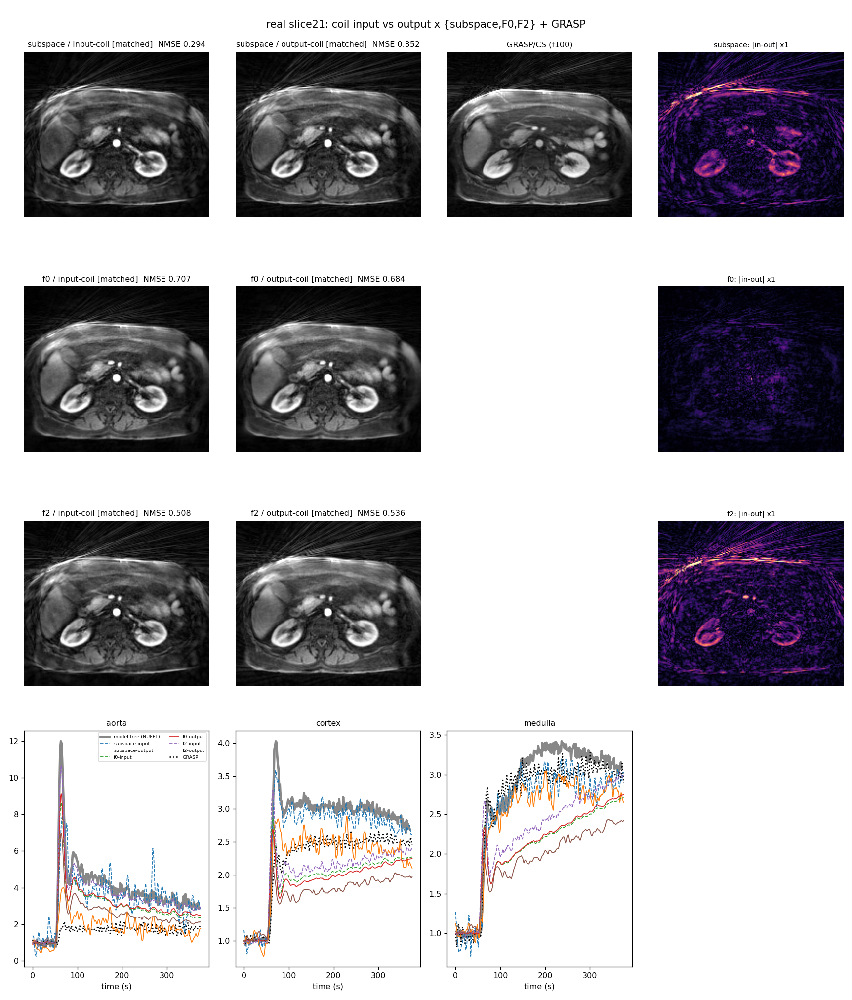

In [23]:
display(Image('/net/beegfs/users/P101440/DCE_NIK/results/realdata_nik_vs_cs_figures/figures/outcoil_report.png'))

# 4. temporal expressiveness: phi_w0 vs rank, real slice 21
output-coil under-reads in-vivo bolus (sec 3). knob: rank R or siren freq phi_w0. output-coil subspace, matched spokes, val stop, 20k, vs model-free nufft.

| config | rank | phi_w0 | held-out nmse | aorta pk/mf | aorta curve nmse |
|---|---|---|---|---|---|
| input-coil (ref) | 16 | 30 | 0.295 | 0.66 | 0.251 |
| output baseline | 16 | 30 | 0.352 | 0.33 | 0.549 |
| output | 32 | 30 | 0.355 | 0.40 | 0.479 |
| output | 48 | 30 | 0.375 | 0.40 | 0.491 |
| output | 16 | 90 | 0.249 | 0.57 | 0.328 |
| output | 32 | 90 | 0.246 | 0.50 | 0.360 |

- phi_w0 = lever. 30->90: aorta peak 0.33->0.57, curve nmse 0.55->0.33.
- rank saturates. 16->32 flat, hurts at w0 90.
- w0 90 beats input on held-out (0.246 vs 0.295), trails on aorta peak (0.57 vs 0.66).
- spatial unchanged.

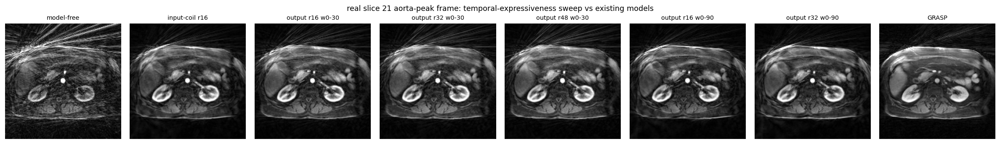

In [24]:
display(Image('/net/beegfs/users/P101440/DCE_NIK/results/realdata_nik_vs_cs_figures/figures/step1_images.png'))

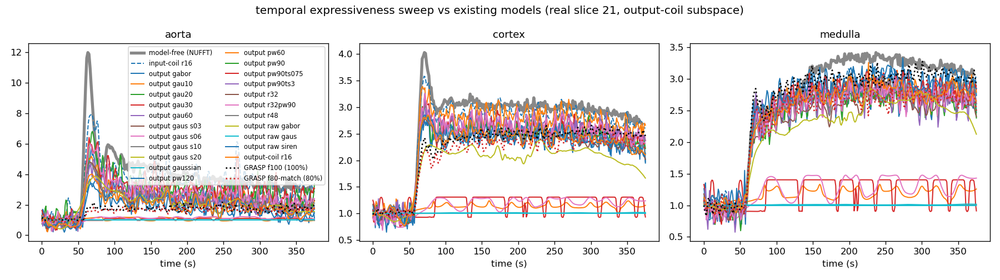

In [25]:
display(Image('/net/beegfs/users/P101440/DCE_NIK/results/realdata_nik_vs_cs_figures/figures/step1_compare.png'))

# 5. w0 and t_sigma sweep, real slice 21
w0 30/60/90/120, t_sigma 0.75/1.5/3.0 at w0 90. rank 16. vs model-free.

| config | phi_w0 | t_sigma | held-out nmse | aorta pk/mf | aorta curve nmse |
|---|---|---|---|---|---|
| input-coil (ref) | 30 | 1.5 | 0.295 | 0.66 | 0.251 |
| output | 30 | 1.5 | 0.352 | 0.33 | 0.549 |
| output | 60 | 1.5 | 0.268 | 0.43 | 0.430 |
| output | 90 | 1.5 | 0.249 | 0.57 | 0.328 |
| output | 120 | 1.5 | 0.244 | 0.48 | 0.422 |
| output | 90 | 0.75 | 0.249 | 0.54 | 0.346 |
| output | 90 | 3.0 | 0.243 | 0.42 | 0.455 |

- w0 90 = bolus sweet spot (0.57), inverted-u. t_sigma 1.5 best.
- held-out nmse vs bolus diverge: w0 120 / t_sigma 3.0 best held-out (0.244/0.243), worse bolus (0.48/0.42). single-metric = wrong pick.
- input-coil gap (0.66) stays, output ~14% below. intrinsic damping.

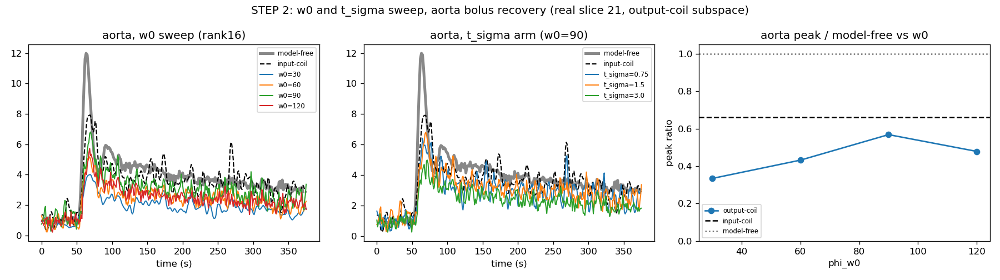

In [26]:
display(Image('/net/beegfs/users/P101440/DCE_NIK/results/realdata_nik_vs_cs_figures/figures/step2_compare.png'))

# 6. temporal activation: siren vs gabor vs gaussian, real slice 21
rank 16, w0 90 fixed, all three. gaussian layer inline.

| activation | held-out nmse | aorta pk/mf | aorta curve nmse |
|---|---|---|---|
| siren (w0 90) | 0.249 | 0.57 | 0.328 |
| gabor / wire | 0.281 | 0.31 | 0.550 |
| gaussian | 0.637 | 0.08 | 0.788 |

- siren wins both. yes, siren best.
- gabor trains, under-reads bolus (0.31).
- gaussian bad at every scale (w0 10/20/30/60/90, held-out 0.60-0.64 vs siren 0.249; best w0 10 = 0.597). genuinely worse, not under-tuned.
- images: siren/gabor ok, gaussian washed.

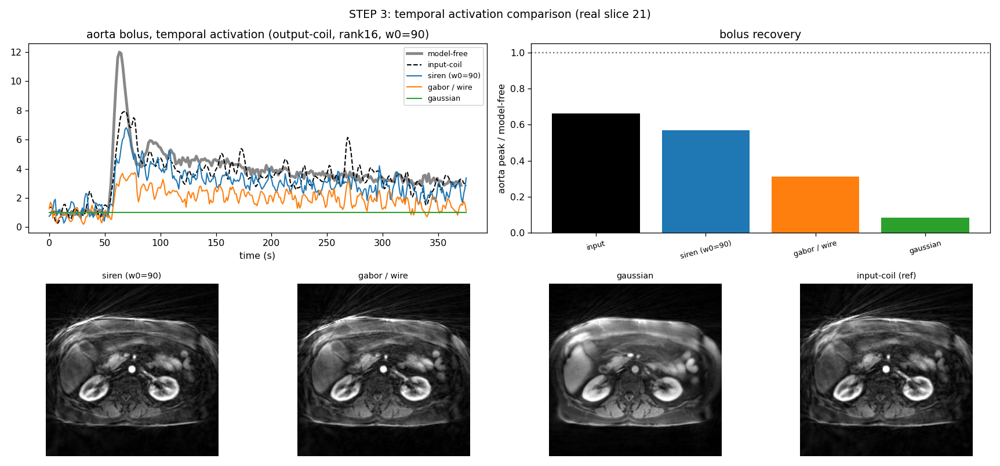

In [27]:
display(Image('/net/beegfs/users/P101440/DCE_NIK/results/realdata_nik_vs_cs_figures/figures/step3_compare.png'))

# 7. fair grasp: spoke-matched, real slice 21
fairness fix. earlier grasp (f100) used 100% spokes, nik 80% (20% held out), so grasp had ~25% more data on every real metric above. here grasp on nik's exact 80% spokes (v%10<8, not just matched count): per-point keep mask into grog, kept-navigator basis. additional to f100, not replacement. held-out nmse from logs.

| config | spokes | aorta pk/mf | aorta nmse | cortex nmse | medulla nmse | held-out nmse |
|---|---|---|---|---|---|---|
| nik input | 80% | 0.66 | 0.251 | 0.056 | 0.098 | 0.294 |
| nik output w0-90 | 80% | 0.57 | 0.328 | 0.159 | 0.172 | 0.249 |
| grasp f100 | 100% | 0.18 | 0.642 | 0.205 | 0.073 | - |
| grasp f80-match | 80% | 0.16 | 0.659 | 0.252 | 0.155 | - |

- spoke-matching degrades grasp everywhere (less data).
- medulla was grasp's only win (0.073). matched: 0.155, worse than nik input (0.098). the win was the extra spokes.
- matched, nik beats grasp on every metric.
- aorta unchanged, nik already won with less data.

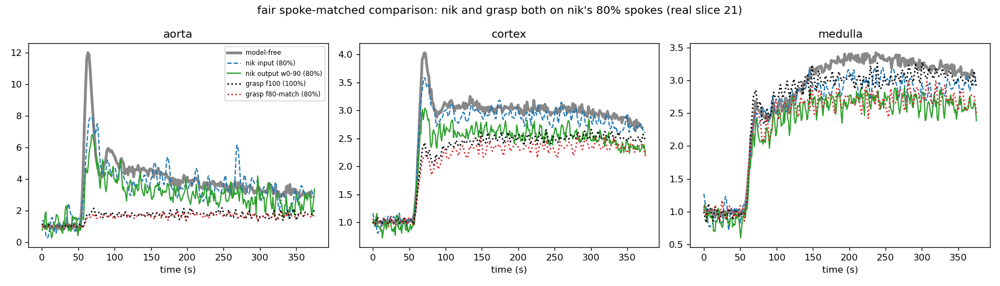

In [28]:
display(Image('/net/beegfs/users/P101440/DCE_NIK/results/realdata_nik_vs_cs_figures/figures/step7_fairgrasp.png'))

# 8. actual-signal curves (single-constant calibration)

per-curve baseline division (curve/own first-8-frames) exaggerates cross-method spread. alternative: scale each method by ONE constant = median over body mask, pre-contrast (t<40s), giving shared "body pre-contrast=1" units. additive, baseline-normalized plots above unchanged.

checks (all pass): scale region-independent (core/body ratio CoV 1.3% across methods), calibration is a pure global scale (baseline-norm of calibrated == baseline-norm of raw, shape unchanged), body mask anatomy-aligned, mf native unit ~10x nik/grasp (unnormalized finufft, expected).

aorta peak / model-free:

| method | baseline-norm | calibrated |
|---|---|---|
| nik input | 0.66 | 0.83 |
| nik output w0-90 | 0.57 | 0.84 |
| grasp f80-match | 0.16 | 0.46 |

- methods agree far closer in actual signal. cortex/medulla near-identical across all four; baseline-norm spread was mostly per-roi baseline differences.
- nik input vs output bolus gap DISAPPEARS (0.83 vs 0.84). the ~14% gap in sec 4-6 was a baseline-norm artifact, not a real output-coil deficit.
- grasp still lowest on aorta (0.46, small-vessel psf) but ~3x closer than baseline-norm (0.16) implied.
- mf's towering baseline-norm aorta (~12x) was a low-aorta-baseline artifact; calibrated it is 5.8, nik ~4.8 (83%).

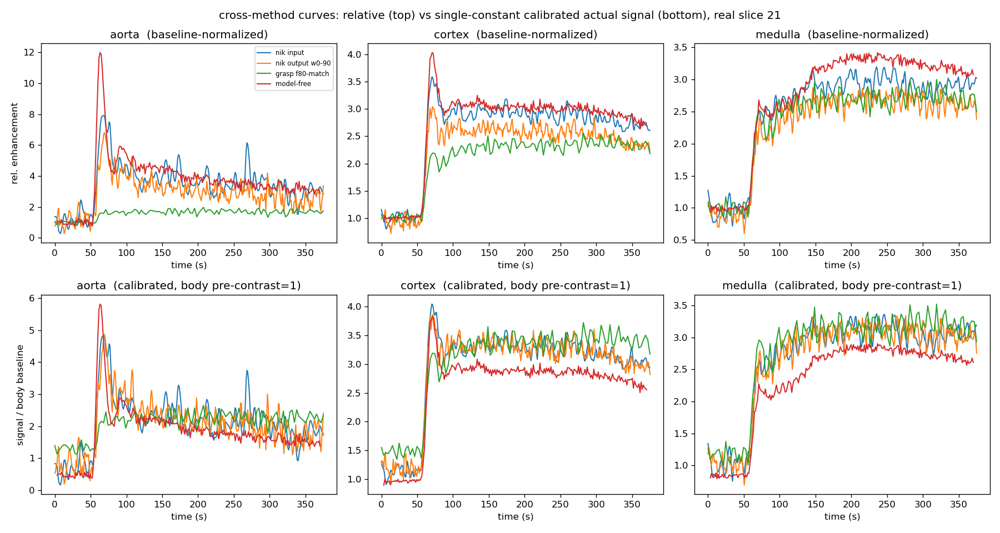

In [29]:
display(Image('/net/beegfs/users/P101440/DCE_NIK/results/realdata_nik_vs_cs_figures/figures/calib_curves.png'))

# summary

| domain | finding |
|---|---|
| phantom render bug 1 | +1px rot180 shift (nik only), inflated gap ~4x; fixed, assertion-guarded |
| phantom render bug 2 | single-fov ifft aliasing; 2x oversample = +1.7 to +5.3 db psnr, seed spread collapsed |
| phantom global image | best nik haarpsi 0.90 vs grasp 0.87 (first metric); psnr gap 4.3 -> 1.2 db; ssim 0.93 vs 0.95 |
| phantom spatial residual | smooth low-|k| envelope bias (+4.2 db post-hoc); env 0.75 optimal, dead-end knob |
| phantom reproducibility | nik seed spread (0.023 ssim, 3.4 db) ~ grasp gap |
| phantom whole-curve | nik wins (aorta 0.09 vs 0.22) + exact timing |
| phantom aorta peak | nik +10% overshoot (seed-variable); grasp peak-exact, 2.6s late |
| phantom k selection | held-out cv k*=12 (sharp min), captures bolus |
| phantom pk | nik-sub16 edges grasp on tissue ktrans |
| real temporal denoising | nik advantage, cs osc noise |
| real pk inter-slice | quantification support |
| real spoke frontier | level after removing the cs temporal-basis leak; nik ahead at 50%; was wrongly cs-favored |
| coil placement (phantom) | output-coil beats input (sub16) all metrics; best nik, haarpsi 0.90 clears grasp; ~8x cheaper |
| coil placement (real) | held-out nmse parity; vs model-free output under-reads amplitude (low bias like grasp), input tracks; phantom win no replicate |
| real, phi_w0 vs rank | phi_w0 recovers bolus not rank. w0 30->90: peak 0.33->0.57. rank saturates. input gap 0.57 vs 0.66 |
| real, w0 optimum | w0 90 sweet spot (0.57), inverted-u; t_sigma 1.5 best. held-out nmse diverges from bolus. input gap ~14% |
| real, activation | siren best. gabor under-reads (0.31), gaussian degenerate at w0 90 (under-tuned) |

headline: most nik-vs-grasp spatial gap = rendering, not model. 3 render fixes (support radius, 1px rot180, aliasing): nik wins haarpsi (0.90 vs 0.87), psnr gap 1.2 db, ssim behind (0.93 vs 0.95), nik wins whole-curve + timing. correctness fix, not modelling gain.
| real, spoke fairness | earlier grasp used 100% spokes vs nik 80% (~25% more). matched (grasp on nik's exact 80%): grasp degrades everywhere, medulla win 0.073->0.155 (was extra spokes). matched, nik wins every metric |
| real, actual-signal calibration | per-curve baseline-norm exaggerated spread. one-constant body-anchor calibration (checks pass): nik input==output on aorta (0.83 vs 0.84, the sec4-6 gap was an artifact); grasp 0.16->0.46; cortex/medulla near-identical across methods |


# addendum, 2026-09-10

sections 9 (single fair setting, spokes/frame frontier) and 10 (tofts basis vs patlak, rank 8, early stop, in vivo figures) live in `NIK_vs_GRASPv2_combined_report.ipynb`; sections 1 to 8 are shared. the big picture below is the same in both notebooks.


two claims on the table, different evidence each.

**a. nik somewhat superior to grasp (v2 or pro) as a recon.** phantom at the single fair setting (25 spf, lam 0.25, matched spokes): images tie (haarpsi 0.899 vs 0.902, psnr 36.7 vs 38.3, nik sharper at equal noise), nik-free wins the tissue curves 3.5 to 6.5x and the bolus peak (+4 to 7% vs -19%). tuned grasp v2 (40 spf, lam 0.02) beats nik on every image metric (haarpsi 0.966, psnr 44.9), at 43 frames vs nik's 344: never compared at equal temporal resolution. vs grasp pro (k12 cv-fair): haarpsi 0.90 vs 0.87, psnr 37.4 vs 38.5, aorta curve 0.08 vs 0.16. in vivo: held-out k-space is the only unbiased ruler and cannot score grasp (magnitude saves); the model-free curve ruler favours grasp v2 but contradicts physics (aorta fwhm 53 s grasp v2, 23 s nik, 17 s model-free, 12.5 s truth); nik temporal denoising real (15 to 50x), pk inter-slice consistency better (vp cov 2 to 5 vs 11 to 37). status: not supportable as stated; the only open framing is equal temporal resolution or continuous time at cs image quality.

**b. qmri parameter maps from a physics basis (patlak / tofts nik).** phantom: tofts basis vs patlak = ssim 0.84 to 0.94, psnr +6 db, kidney curves 7 to 13x, held-out k-space 13x, because the generator is extended kety and the patlak span cannot represent it; under motion the same direction, smaller, grasp v2 degrades least on images. in vivo: rank 8 equals patlak on held-out k-space (18/19) with the best kidney curve shapes; aorta stays patlak's by construction. status: the basis is shown to fit curves and images; no parameter map has been produced or scored yet, on a phantom whose true ke/ve/vp per voxel are known. that is the missing experiment.

**possible bugs, by how much they could move conclusions**

1. in vivo tissue amplitude deficit, all nik arms: cortex and medulla plateaus at 0.65 to 0.75 of model-free (grasp v2 and pro on model-free), tofts arms 0.57 of the aorta peak. candidates: early stop on a static-dominated held-out ruler (every run restores step 2000, train keeps falling to 40k), the one global ls scale over the whole body, coil envelope 0.75 with dcf off. absent on the phantom (peak errors 4 to 9%), which points at normalization or the reference rather than the model.
2. early stop at step 2000 in 21 of 21 in vivo runs: ruler wrong for dynamics, or overfit from step 1000 with 488 spokes. every in vivo number is a 400 s model; wall 8000 s is the run, not the model.
3. roi masks: cortex and medulla 56 px each, the `liver` mask is posterior tissue, not liver (mf_liver_* measures nothing).
4. model-free reference: streaks, 31-spoke window, aorta peak blurred (17 s vs 12.5 s truth); every "vs model-free" number includes that blur.
5. tofts prior chosen after reading the phantom pklut; phantom aif is the oracle; in vivo aif from all 1710 spokes leaks val/test into both pk arms equally.
6. fixed earlier, each a retraction: three render bugs, pca basis leak, peak-normalization artifacts, lam artifacts, 5 spf artifact (section 1 here still at 5 spf).

**ways forward, ranked**

1. produce the parameter maps (claim b): fit ke/ve/vp from the nik tofts coefficients on the phantom, compare to the xcat truth maps and to grasp v2 + dce-net fitting, per region and as maps. cpu, adapter exists.
2. settle the amplitude deficit: tofts8 sl18 without best-restore at 3k and 8k steps, plus a per-roi baseline-and-scale ruler next to the global one. one gpu hour.
3. equal temporal resolution comparison for claim a: grasp v2 at nik's frame rate (or nik binned to grasp's), same spokes, phantom. either the one defensible "nik beats grasp" statement or the end of claim a.
4. fix the masks before any curve number goes further.
5. complex-valued grasp saves, so held-out k-space scores grasp in vivo too.
